In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/coco2017/"
x = load('/kaggle/input/monumentimagenotaugmented/train/monumentimage_10006.jpg')
print(x.shape)

(683, 1024, 3)


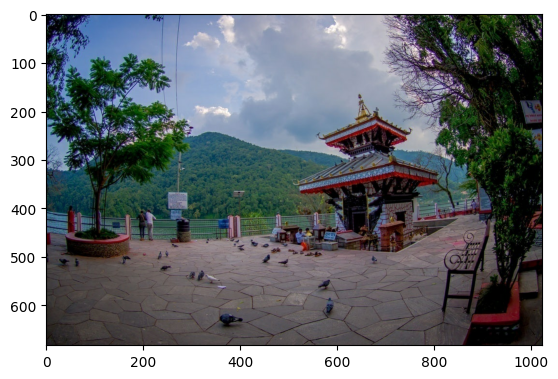

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

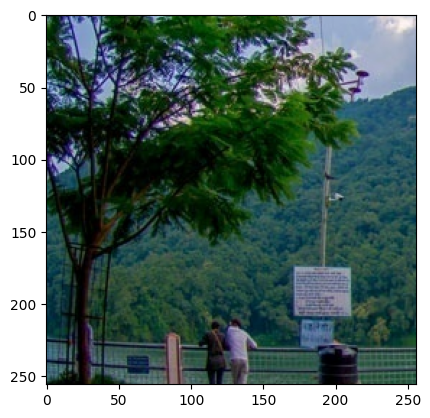

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

In [14]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

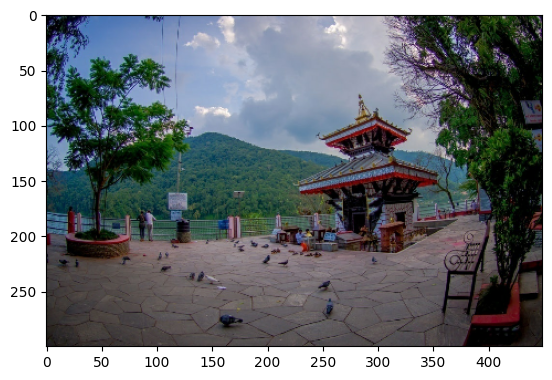

In [15]:
x = resize_with_aspect_ratio(x,300)
plt.imshow(x/255)

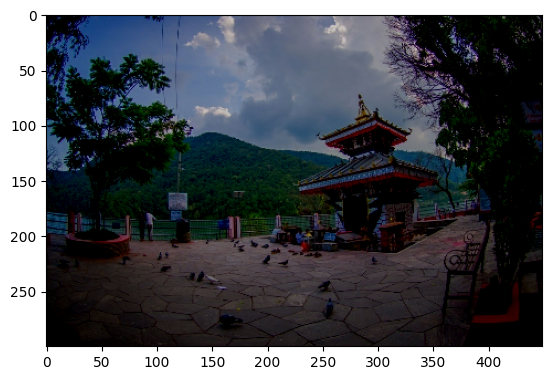

In [16]:
x_brightness = tf.image.random_brightness(x, 75)
plt.imshow(x_brightness/255)

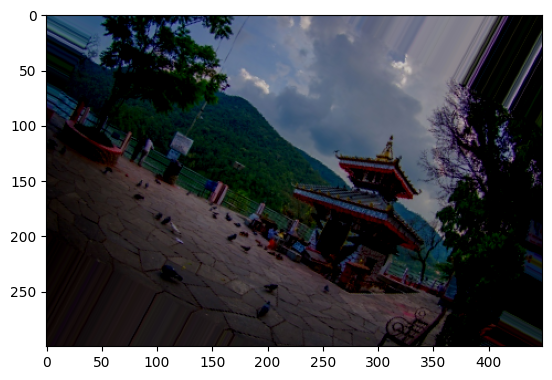

In [17]:
# Define the rotation angle in radians
rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

# Apply the rotation using tfa.image.rotate
x_rotated = tfa.image.rotate(x_brightness, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
plt.imshow(x_rotated/255)

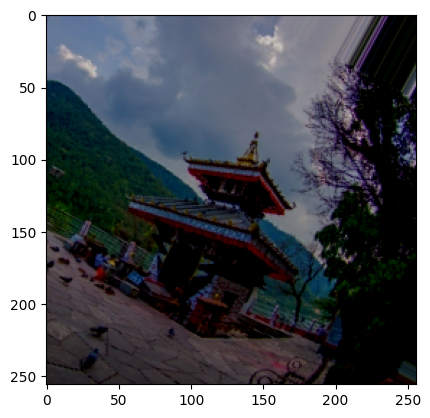

In [18]:
x_aug = random_crop(x_rotated)
plt.imshow(x_aug/255.0)

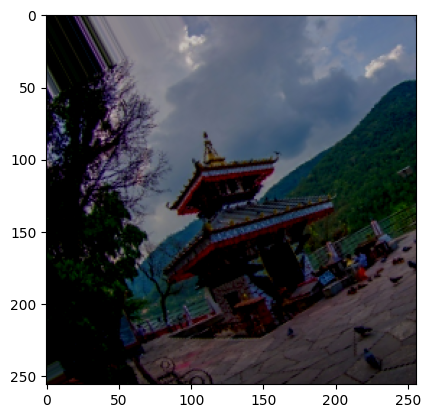

In [19]:
x_jitter = random_jitter(x_aug)
plt.imshow(x_jitter/255.0)

In [20]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 75)
    # Define the rotation angle in radians
    rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
    real_image = random_crop(real_image)
    

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [21]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [22]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [23]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files('/kaggle/input/monumentimagenotaugmented/train/*')
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

525

In [24]:
# create input pipeline
val = tf.data.Dataset.list_files('/kaggle/input/monumentimagenotaugmented/val/*')
val = val.map(load_test_image)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

70

In [25]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [26]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 225, 3)


In [27]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 450, 3)


In [28]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

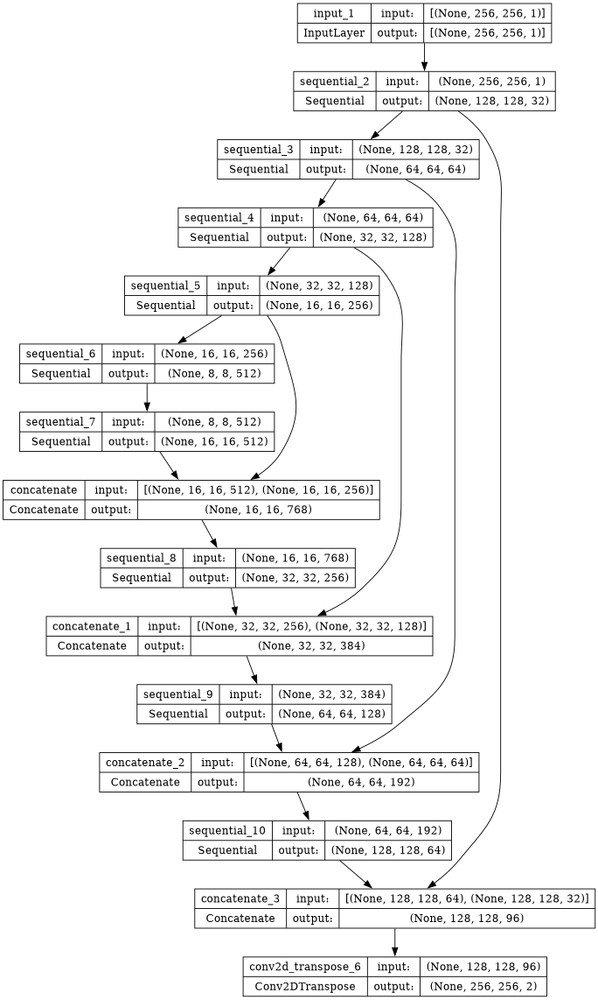

In [29]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [30]:
gen.load_weights('/kaggle/input/trainwithchangeinaugparam/modelsFeb7/gen_weight.keras')

In [31]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

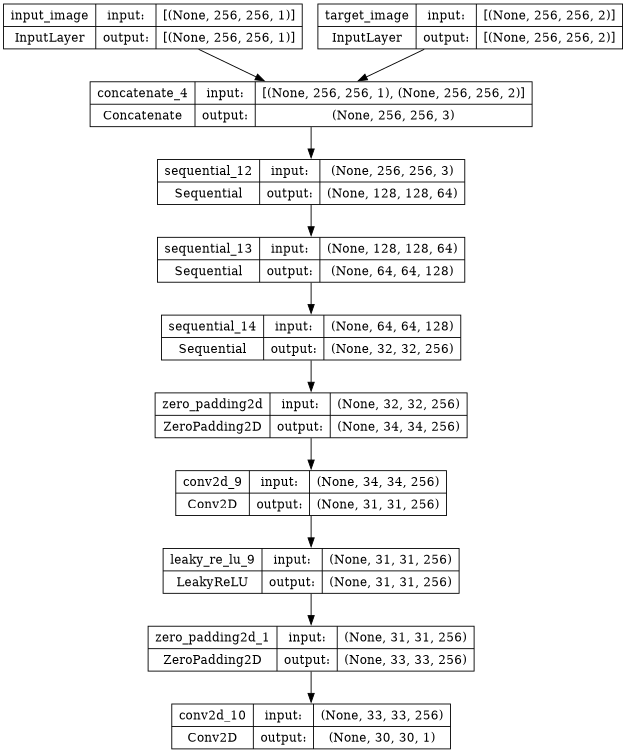

In [32]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [33]:
disc.load_weights('/kaggle/input/trainwithchangeinaugparam/modelsFeb7/disc_wweight.keras')

In [34]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [35]:
LAMBDA = 150

In [36]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [37]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [38]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [39]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [40]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [41]:
epochs = 250

In [42]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [43]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [44]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [45]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [46]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [47]:
os.mkdir('/kaggle/working/gen_output/')

In [48]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [49]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image,256)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


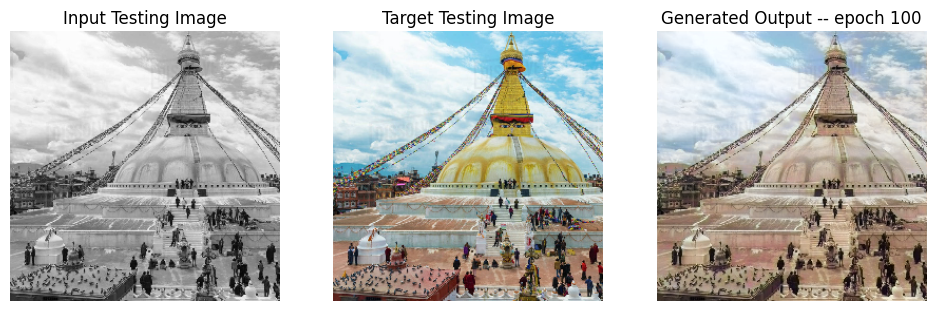

SSIM Score: 0.9189391732215881
PSNR Score: 22.34894371032715


In [50]:
display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/monumentimage_10345.jpg',100)

In [51]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/monumentimagenotaugmented/val/monumentimage_10345.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [52]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 5s 0us/step
Training Details
Generator-- total_loss:8.15761 gan_loss:1.03065 l1_loss:0.04002 perceptual_loss:0.00749 Discriminator-- total_loss:1.80979 real_loss:0.90009 generated_loss:0.90970 --- SSIM 0.90537 PSNR 23.97649 LPIPS 0.00000
Time taken for epoch 1 is 655.002189874649 sec
Number of iteration 525
Validation Details
Generator-- total_loss:9.12068 gan_loss:1.07435 l1_loss:0.04530  perceptual_loss:0.00834 Discriminator-- total_loss:1.76610 real_loss:0.53247 generated_loss:1.23363 --- SSIM 0.93438 PSNR 22.73085 LPIPS 0.00000
Time taken for epoch 1 is 704.6749267578125 sec
Number of iteration 70
Displaying one random test image...


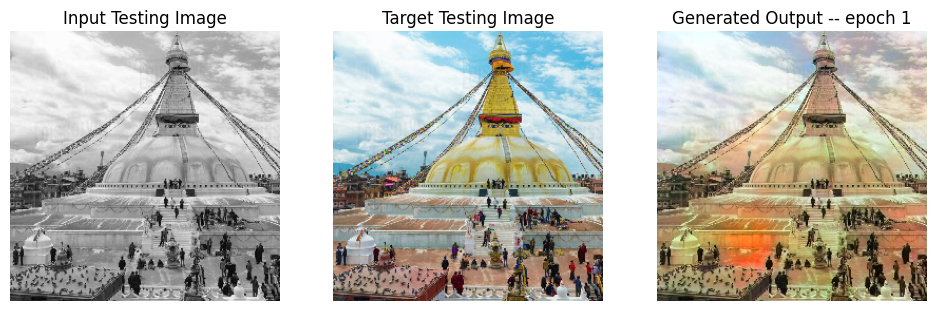

SSIM Score: 0.8933820724487305
PSNR Score: 18.933349609375
Epoch 1
Training Details
Generator-- total_loss:8.06860 gan_loss:0.93038 l1_loss:0.04021 perceptual_loss:0.00738 Discriminator-- total_loss:1.34556 real_loss:0.65806 generated_loss:0.68749 --- SSIM 0.90592 PSNR 23.92537 LPIPS 0.00000
Time taken for epoch 2 is 656.3533003330231 sec
Number of iteration 525
Validation Details
Generator-- total_loss:8.52036 gan_loss:0.49124 l1_loss:0.04545  perceptual_loss:0.00807 Discriminator-- total_loss:1.60465 real_loss:1.10688 generated_loss:0.49777 --- SSIM 0.93858 PSNR 22.62094 LPIPS 0.00000
Time taken for epoch 2 is 703.2437541484833 sec
Number of iteration 70
Epoch 2
Training Details
Generator-- total_loss:8.11891 gan_loss:0.94030 l1_loss:0.04046 perceptual_loss:0.00739 Discriminator-- total_loss:1.30990 real_loss:0.64147 generated_loss:0.66843 --- SSIM 0.90356 PSNR 23.86775 LPIPS 0.00000
Time taken for epoch 3 is 651.0223236083984 sec
Number of iteration 525
Validation Details
Generator-

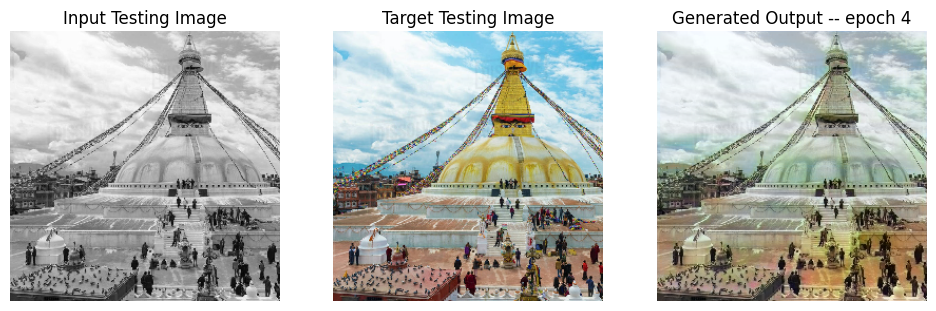

SSIM Score: 0.9098044037818909
PSNR Score: 21.557920455932617
Epoch 4
Training Details
Generator-- total_loss:8.15954 gan_loss:0.94827 l1_loss:0.04068 perceptual_loss:0.00740 Discriminator-- total_loss:1.28878 real_loss:0.62839 generated_loss:0.66038 --- SSIM 0.90189 PSNR 23.78422 LPIPS 0.00000
Time taken for epoch 5 is 639.0175273418427 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.96051 gan_loss:0.32662 l1_loss:0.04312  perceptual_loss:0.00777 Discriminator-- total_loss:1.71819 real_loss:1.37759 generated_loss:0.34060 --- SSIM 0.93745 PSNR 23.23112 LPIPS 0.00000
Time taken for epoch 5 is 686.2442042827606 sec
Number of iteration 70
Epoch 5
Training Details
Generator-- total_loss:8.22842 gan_loss:0.93499 l1_loss:0.04118 perceptual_loss:0.00744 Discriminator-- total_loss:1.28106 real_loss:0.62731 generated_loss:0.65375 --- SSIM 0.90079 PSNR 23.69073 LPIPS 0.00000
Time taken for epoch 6 is 632.9286665916443 sec
Number of iteration 525
Validation Details
Generat

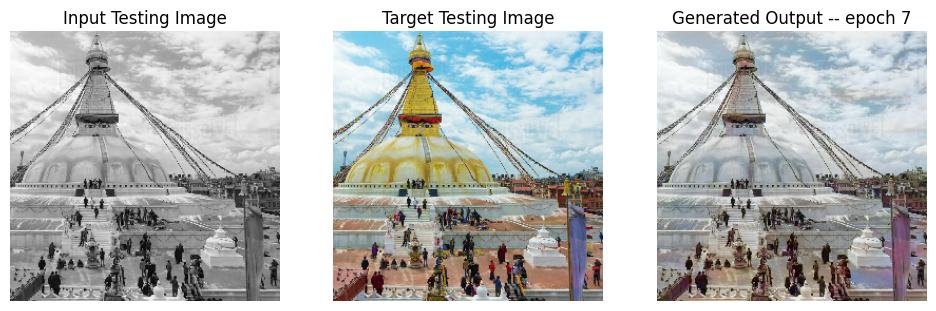

SSIM Score: 0.9027883410453796
PSNR Score: 21.41920280456543
Epoch 7
Training Details
Generator-- total_loss:8.19569 gan_loss:0.94764 l1_loss:0.04087 perceptual_loss:0.00745 Discriminator-- total_loss:1.27682 real_loss:0.62419 generated_loss:0.65263 --- SSIM 0.89808 PSNR 23.72426 LPIPS 0.00000
Time taken for epoch 8 is 636.2079362869263 sec
Number of iteration 525
Validation Details
Generator-- total_loss:8.77263 gan_loss:1.02314 l1_loss:0.04390  perceptual_loss:0.00776 Discriminator-- total_loss:1.72338 real_loss:0.68202 generated_loss:1.04136 --- SSIM 0.93559 PSNR 23.26240 LPIPS 0.00000
Time taken for epoch 8 is 683.0977275371552 sec
Number of iteration 70
Epoch 8
Training Details
Generator-- total_loss:8.18081 gan_loss:0.95227 l1_loss:0.04075 perceptual_loss:0.00744 Discriminator-- total_loss:1.27802 real_loss:0.62124 generated_loss:0.65678 --- SSIM 0.89796 PSNR 23.75378 LPIPS 0.00000
Time taken for epoch 9 is 634.0902452468872 sec
Number of iteration 525
Validation Details
Generato

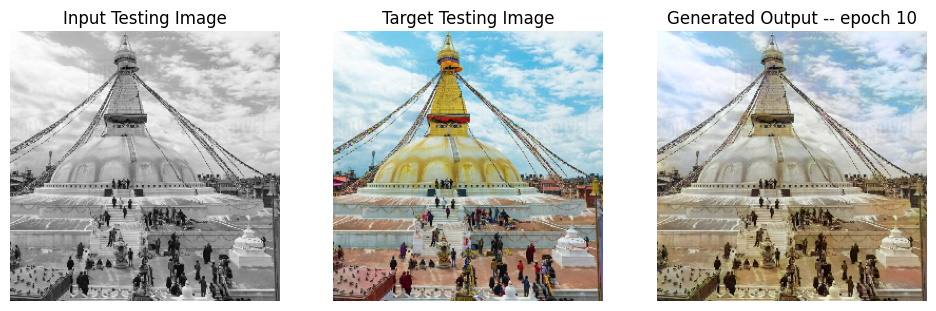

SSIM Score: 0.9146638512611389
PSNR Score: 22.457563400268555
Epoch 10
Training Details
Generator-- total_loss:7.48260 gan_loss:0.48152 l1_loss:0.03944 perceptual_loss:0.00723 Discriminator-- total_loss:1.48755 real_loss:1.15243 generated_loss:0.33512 --- SSIM 0.88537 PSNR 23.97920 LPIPS 0.00000
Time taken for epoch 11 is 576.2007863521576 sec
Number of iteration 525
Validation Details
Generator-- total_loss:7.39137 gan_loss:0.34214 l1_loss:0.03944  perceptual_loss:0.00756 Discriminator-- total_loss:1.64380 real_loss:1.31948 generated_loss:0.32432 --- SSIM 0.93058 PSNR 23.95244 LPIPS 0.00000
Time taken for epoch 11 is 622.7026309967041 sec
Number of iteration 70
Epoch 11
Training Details
Generator-- total_loss:14.49257 gan_loss:7.28164 l1_loss:0.04080 perceptual_loss:0.00727 Discriminator-- total_loss:0.16143 real_loss:0.07720 generated_loss:0.08423 --- SSIM 0.88663 PSNR 23.69165 LPIPS 0.00000
Time taken for epoch 12 is 432.5919179916382 sec
Number of iteration 525
Validation Details
G

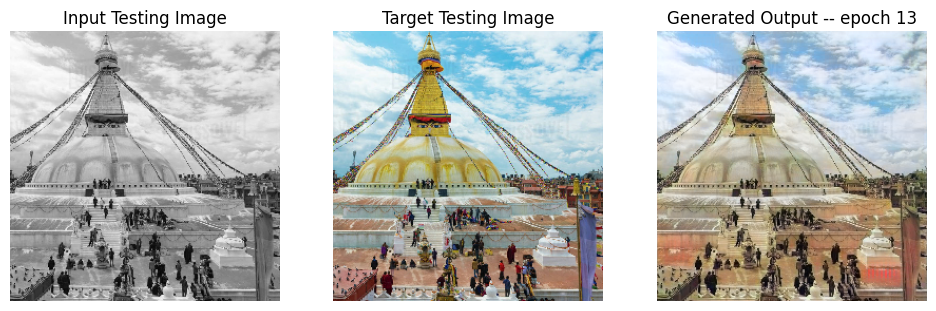

SSIM Score: 0.9031403660774231
PSNR Score: 22.296289443969727
Epoch 13
Training Details
Generator-- total_loss:19.46794 gan_loss:12.25843 l1_loss:0.04079 perceptual_loss:0.00727 Discriminator-- total_loss:0.00604 real_loss:0.00515 generated_loss:0.00089 --- SSIM 0.88538 PSNR 23.67654 LPIPS 0.00000
Time taken for epoch 14 is 431.5595736503601 sec
Number of iteration 525
Validation Details
Generator-- total_loss:20.01568 gan_loss:12.69682 l1_loss:0.04132  perceptual_loss:0.00747 Discriminator-- total_loss:12.05941 real_loss:0.08287 generated_loss:11.97654 --- SSIM 0.91226 PSNR 23.40623 LPIPS 0.00000
Time taken for epoch 14 is 478.56655621528625 sec
Number of iteration 70
Epoch 14
Training Details
Generator-- total_loss:24.02294 gan_loss:16.82705 l1_loss:0.04073 perceptual_loss:0.00724 Discriminator-- total_loss:0.09970 real_loss:0.03827 generated_loss:0.06143 --- SSIM 0.88659 PSNR 23.70098 LPIPS 0.00000
Time taken for epoch 15 is 443.0699231624603 sec
Number of iteration 525
Validation D

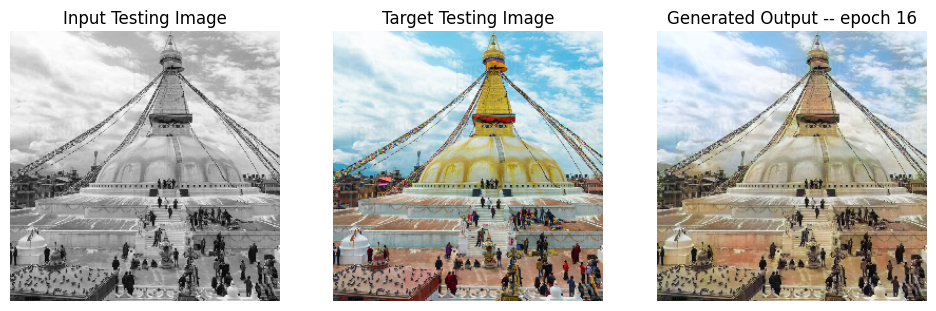

SSIM Score: 0.9164941906929016
PSNR Score: 22.78243064880371
Epoch 16
Training Details
Generator-- total_loss:28.66024 gan_loss:21.43120 l1_loss:0.04089 perceptual_loss:0.00730 Discriminator-- total_loss:0.07746 real_loss:0.05131 generated_loss:0.02615 --- SSIM 0.88539 PSNR 23.66642 LPIPS 0.00000
Time taken for epoch 17 is 431.1463940143585 sec
Number of iteration 525
Validation Details
Generator-- total_loss:23.71817 gan_loss:16.34448 l1_loss:0.04161  perceptual_loss:0.00755 Discriminator-- total_loss:12.21001 real_loss:0.00036 generated_loss:12.20965 --- SSIM 0.91215 PSNR 23.34233 LPIPS 0.00000
Time taken for epoch 17 is 478.67157673835754 sec
Number of iteration 70
Epoch 17
Training Details
Generator-- total_loss:28.80163 gan_loss:21.58005 l1_loss:0.04086 perceptual_loss:0.00728 Discriminator-- total_loss:0.00004 real_loss:0.00001 generated_loss:0.00003 --- SSIM 0.88643 PSNR 23.66466 LPIPS 0.00000
Time taken for epoch 18 is 434.6821827888489 sec
Number of iteration 525
Validation De

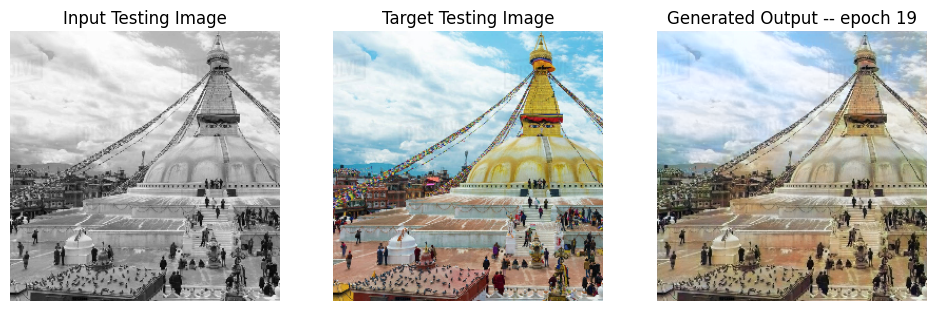

SSIM Score: 0.9195742011070251
PSNR Score: 22.53302764892578
Epoch 19
Training Details
Generator-- total_loss:30.11989 gan_loss:22.90642 l1_loss:0.04081 perceptual_loss:0.00728 Discriminator-- total_loss:0.03074 real_loss:0.01596 generated_loss:0.01477 --- SSIM 0.88679 PSNR 23.68568 LPIPS 0.00000
Time taken for epoch 20 is 434.7723066806793 sec
Number of iteration 525
Validation Details
Generator-- total_loss:37.80748 gan_loss:30.39653 l1_loss:0.04186  perceptual_loss:0.00755 Discriminator-- total_loss:9.81465 real_loss:0.01979 generated_loss:9.79486 --- SSIM 0.91128 PSNR 23.27294 LPIPS 0.00000
Time taken for epoch 20 is 481.83453035354614 sec
Number of iteration 70
Epoch 20
Training Details
Generator-- total_loss:32.04280 gan_loss:24.81748 l1_loss:0.04089 perceptual_loss:0.00728 Discriminator-- total_loss:0.04032 real_loss:0.03985 generated_loss:0.00046 --- SSIM 0.88593 PSNR 23.66022 LPIPS 0.00000
Time taken for epoch 21 is 431.78135561943054 sec
Number of iteration 525
Validation Det

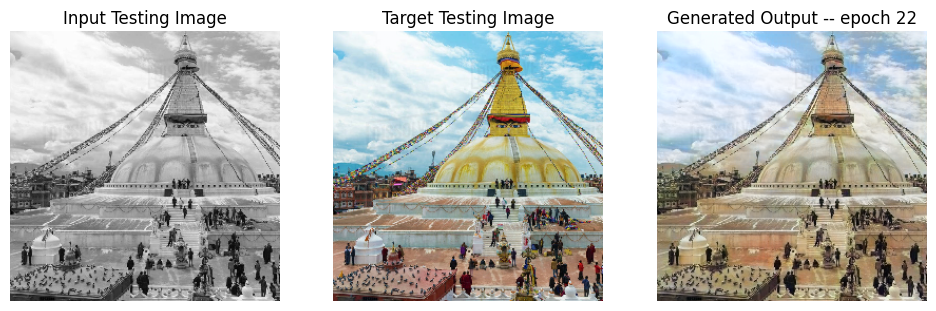

SSIM Score: 0.9162912368774414
PSNR Score: 22.55014991760254
Epoch 22
Training Details
Generator-- total_loss:37.75509 gan_loss:30.54034 l1_loss:0.04084 perceptual_loss:0.00726 Discriminator-- total_loss:0.01773 real_loss:0.01773 generated_loss:0.00000 --- SSIM 0.88632 PSNR 23.66825 LPIPS 0.00000
Time taken for epoch 23 is 435.48630380630493 sec
Number of iteration 525
Validation Details
Generator-- total_loss:65.03325 gan_loss:57.67021 l1_loss:0.04158  perceptual_loss:0.00750 Discriminator-- total_loss:40.65371 real_loss:0.00002 generated_loss:40.65370 --- SSIM 0.91224 PSNR 23.35063 LPIPS 0.00000
Time taken for epoch 23 is 482.5708920955658 sec
Number of iteration 70
Epoch 23
Training Details
Generator-- total_loss:54.98355 gan_loss:47.77043 l1_loss:0.04080 perceptual_loss:0.00728 Discriminator-- total_loss:0.09702 real_loss:0.02182 generated_loss:0.07520 --- SSIM 0.88630 PSNR 23.66537 LPIPS 0.00000
Time taken for epoch 24 is 434.5945167541504 sec
Number of iteration 525
Validation De

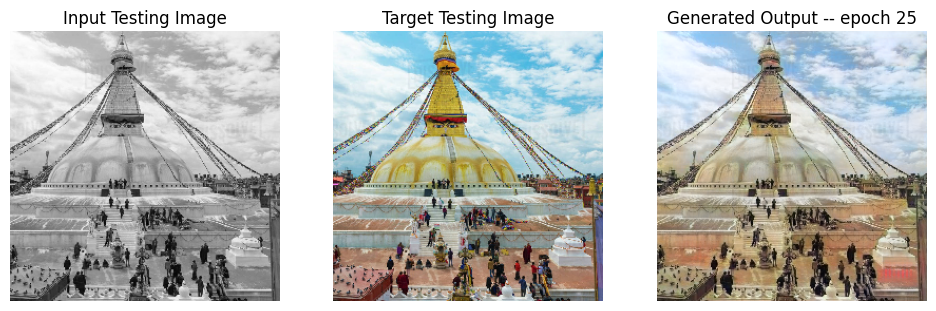

SSIM Score: 0.9091360569000244
PSNR Score: 22.513566970825195
Epoch 25
Training Details
Generator-- total_loss:40.77538 gan_loss:33.55794 l1_loss:0.04087 perceptual_loss:0.00725 Discriminator-- total_loss:0.14055 real_loss:0.04719 generated_loss:0.09336 --- SSIM 0.88575 PSNR 23.66182 LPIPS 0.00000
Time taken for epoch 26 is 434.67738914489746 sec
Number of iteration 525
Validation Details
Generator-- total_loss:39.11405 gan_loss:31.79751 l1_loss:0.04133  perceptual_loss:0.00745 Discriminator-- total_loss:20.92555 real_loss:0.00001 generated_loss:20.92554 --- SSIM 0.91147 PSNR 23.39465 LPIPS 0.00000
Time taken for epoch 26 is 480.90244340896606 sec
Number of iteration 70
Epoch 26
Training Details
Generator-- total_loss:36.88662 gan_loss:29.66204 l1_loss:0.04086 perceptual_loss:0.00730 Discriminator-- total_loss:0.02030 real_loss:0.01478 generated_loss:0.00552 --- SSIM 0.88553 PSNR 23.66603 LPIPS 0.00000
Time taken for epoch 27 is 431.91949248313904 sec
Number of iteration 525
Validation

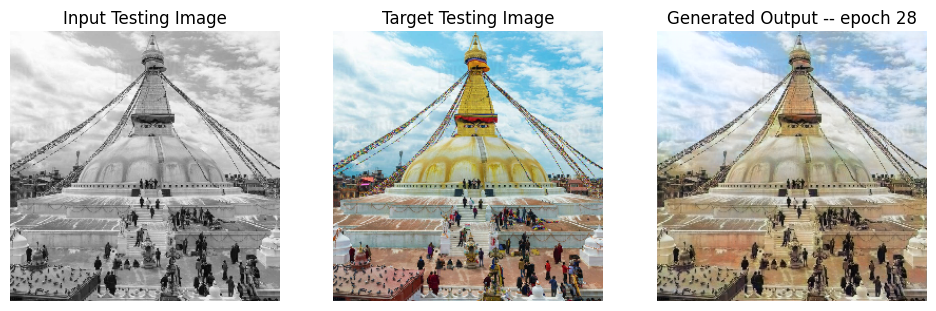

SSIM Score: 0.9151182174682617
PSNR Score: 22.76991081237793
Epoch 28
Training Details
Generator-- total_loss:34.05987 gan_loss:26.84017 l1_loss:0.04085 perceptual_loss:0.00728 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.88583 PSNR 23.66417 LPIPS 0.00000
Time taken for epoch 29 is 432.3679094314575 sec
Number of iteration 525
Validation Details
Generator-- total_loss:30.76994 gan_loss:23.42657 l1_loss:0.04145  perceptual_loss:0.00750 Discriminator-- total_loss:18.20643 real_loss:0.00016 generated_loss:18.20628 --- SSIM 0.91196 PSNR 23.37365 LPIPS 0.00000
Time taken for epoch 29 is 478.5866298675537 sec
Number of iteration 70
Epoch 29
Training Details
Generator-- total_loss:34.44767 gan_loss:27.21270 l1_loss:0.04095 perceptual_loss:0.00729 Discriminator-- total_loss:0.00003 real_loss:0.00002 generated_loss:0.00001 --- SSIM 0.88669 PSNR 23.65830 LPIPS 0.00000
Time taken for epoch 30 is 429.6834352016449 sec
Number of iteration 525
Validation Det

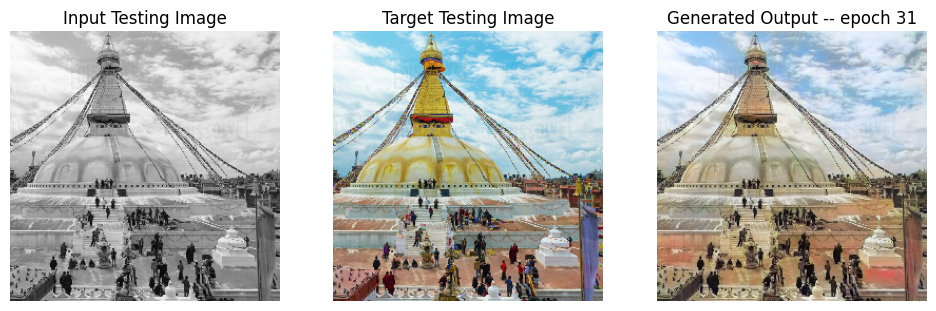

SSIM Score: 0.9042122960090637
PSNR Score: 22.342660903930664
Epoch 31
Training Details
Generator-- total_loss:40.08557 gan_loss:32.85764 l1_loss:0.04088 perceptual_loss:0.00731 Discriminator-- total_loss:0.09175 real_loss:0.01658 generated_loss:0.07517 --- SSIM 0.88610 PSNR 23.66821 LPIPS 0.00000
Time taken for epoch 32 is 430.85951256752014 sec
Number of iteration 525
Validation Details
Generator-- total_loss:69.64548 gan_loss:62.26862 l1_loss:0.04163  perceptual_loss:0.00755 Discriminator-- total_loss:16.57520 real_loss:0.00203 generated_loss:16.57317 --- SSIM 0.91138 PSNR 23.32997 LPIPS 0.00000
Time taken for epoch 32 is 477.63039326667786 sec
Number of iteration 70
Epoch 32
Training Details
Generator-- total_loss:47.97711 gan_loss:40.75894 l1_loss:0.04085 perceptual_loss:0.00727 Discriminator-- total_loss:0.00006 real_loss:0.00004 generated_loss:0.00003 --- SSIM 0.88564 PSNR 23.66418 LPIPS 0.00000
Time taken for epoch 33 is 434.3212296962738 sec
Number of iteration 525
Validation 

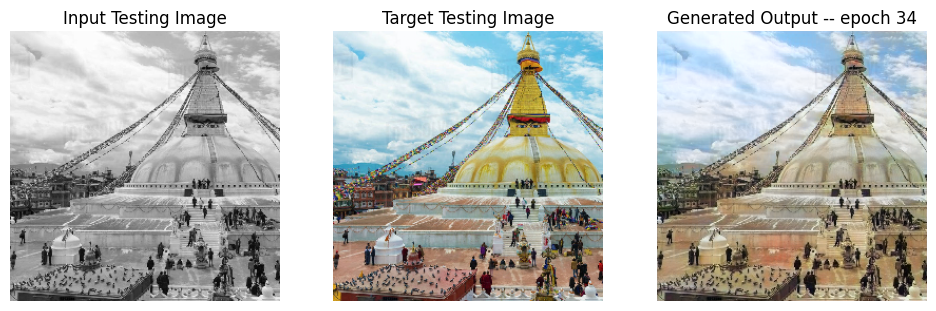

SSIM Score: 0.9176868796348572
PSNR Score: 22.57781219482422
Epoch 34
Training Details
Generator-- total_loss:52.77457 gan_loss:45.56013 l1_loss:0.04082 perceptual_loss:0.00727 Discriminator-- total_loss:0.00066 real_loss:0.00045 generated_loss:0.00021 --- SSIM 0.88630 PSNR 23.65868 LPIPS 0.00000
Time taken for epoch 35 is 436.5237948894501 sec
Number of iteration 525
Validation Details
Generator-- total_loss:70.51464 gan_loss:63.13372 l1_loss:0.04168  perceptual_loss:0.00753 Discriminator-- total_loss:22.91876 real_loss:0.00010 generated_loss:22.91866 --- SSIM 0.91041 PSNR 23.30474 LPIPS 0.00000
Time taken for epoch 35 is 483.38999223709106 sec
Number of iteration 70
Epoch 35
Training Details
Generator-- total_loss:55.75842 gan_loss:48.53776 l1_loss:0.04089 perceptual_loss:0.00725 Discriminator-- total_loss:0.20981 real_loss:0.14450 generated_loss:0.06531 --- SSIM 0.88603 PSNR 23.66105 LPIPS 0.00000
Time taken for epoch 36 is 436.15967774391174 sec
Number of iteration 525
Validation D

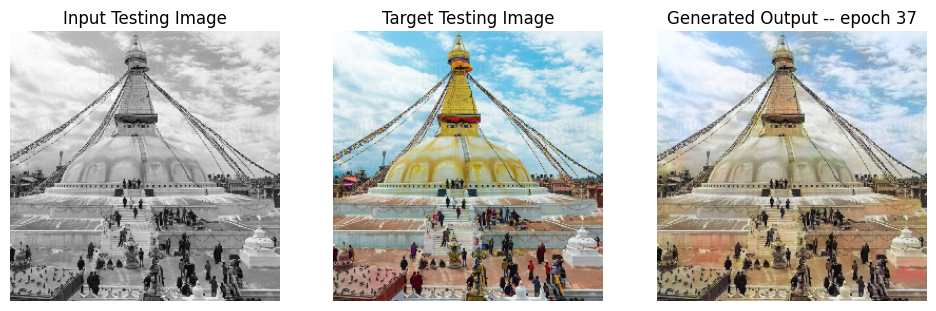

SSIM Score: 0.912559986114502
PSNR Score: 22.717487335205078
Epoch 37
Training Details
Generator-- total_loss:55.20444 gan_loss:47.96873 l1_loss:0.04097 perceptual_loss:0.00727 Discriminator-- total_loss:0.00009 real_loss:0.00001 generated_loss:0.00009 --- SSIM 0.88505 PSNR 23.64130 LPIPS 0.00000
Time taken for epoch 38 is 434.95498538017273 sec
Number of iteration 525
Validation Details
Generator-- total_loss:65.11352 gan_loss:57.72882 l1_loss:0.04171  perceptual_loss:0.00752 Discriminator-- total_loss:32.75278 real_loss:0.00007 generated_loss:32.75272 --- SSIM 0.91123 PSNR 23.33044 LPIPS 0.00000
Time taken for epoch 38 is 482.5114493370056 sec
Number of iteration 70
Epoch 38
Training Details
Generator-- total_loss:55.93346 gan_loss:48.72622 l1_loss:0.04078 perceptual_loss:0.00727 Discriminator-- total_loss:0.00001 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.88614 PSNR 23.68271 LPIPS 0.00000
Time taken for epoch 39 is 436.66922664642334 sec
Number of iteration 525
Validation D

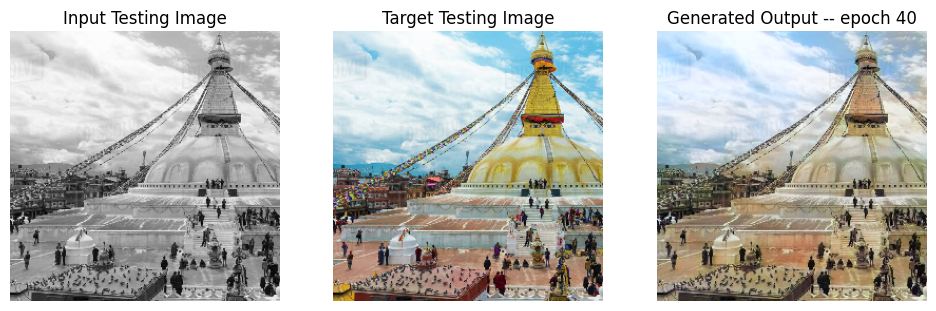

SSIM Score: 0.9193568229675293
PSNR Score: 22.49061393737793
Epoch 40
Training Details
Generator-- total_loss:56.96862 gan_loss:49.73879 l1_loss:0.04096 perceptual_loss:0.00724 Discriminator-- total_loss:0.04323 real_loss:0.01188 generated_loss:0.03135 --- SSIM 0.88611 PSNR 23.64894 LPIPS 0.00000
Time taken for epoch 41 is 434.2569696903229 sec
Number of iteration 525
Validation Details
Generator-- total_loss:75.50361 gan_loss:68.11951 l1_loss:0.04172  perceptual_loss:0.00751 Discriminator-- total_loss:13.21482 real_loss:0.07005 generated_loss:13.14477 --- SSIM 0.91063 PSNR 23.31139 LPIPS 0.00000
Time taken for epoch 41 is 480.998619556427 sec
Number of iteration 70
Epoch 41
Training Details
Generator-- total_loss:44.83857 gan_loss:37.61959 l1_loss:0.04086 perceptual_loss:0.00726 Discriminator-- total_loss:0.00044 real_loss:0.00042 generated_loss:0.00002 --- SSIM 0.88588 PSNR 23.66420 LPIPS 0.00000
Time taken for epoch 42 is 436.9351074695587 sec
Number of iteration 525
Validation Deta

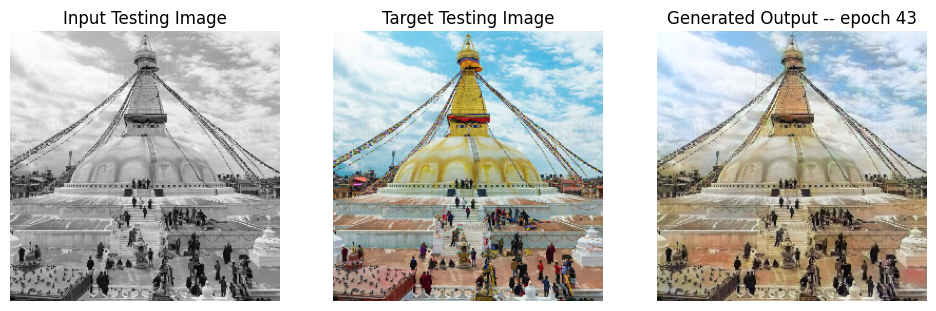

SSIM Score: 0.9144425988197327
PSNR Score: 22.881776809692383
Epoch 43
Training Details
Generator-- total_loss:41.94587 gan_loss:34.71856 l1_loss:0.04091 perceptual_loss:0.00727 Discriminator-- total_loss:0.00001 real_loss:0.00001 generated_loss:0.00000 --- SSIM 0.88543 PSNR 23.66368 LPIPS 0.00000
Time taken for epoch 44 is 433.23740124702454 sec
Number of iteration 525
Validation Details
Generator-- total_loss:54.66730 gan_loss:47.24475 l1_loss:0.04189  perceptual_loss:0.00760 Discriminator-- total_loss:16.49588 real_loss:0.00500 generated_loss:16.49088 --- SSIM 0.91038 PSNR 23.27117 LPIPS 0.00000
Time taken for epoch 44 is 481.375764131546 sec
Number of iteration 70
Epoch 44
Training Details
Generator-- total_loss:45.73524 gan_loss:38.52619 l1_loss:0.04080 perceptual_loss:0.00726 Discriminator-- total_loss:0.00030 real_loss:0.00029 generated_loss:0.00001 --- SSIM 0.88662 PSNR 23.67533 LPIPS 0.00000
Time taken for epoch 45 is 436.47099709510803 sec
Number of iteration 525
Validation D

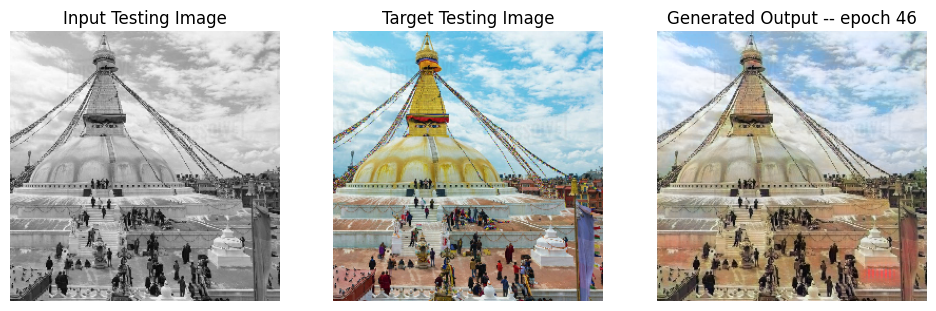

SSIM Score: 0.9024894833564758
PSNR Score: 22.33616828918457
Epoch 46
Training Details
Generator-- total_loss:57.23845 gan_loss:50.01356 l1_loss:0.04088 perceptual_loss:0.00729 Discriminator-- total_loss:0.13186 real_loss:0.03829 generated_loss:0.09357 --- SSIM 0.88571 PSNR 23.67094 LPIPS 0.00000
Time taken for epoch 47 is 431.2138719558716 sec
Number of iteration 525
Validation Details
Generator-- total_loss:65.34492 gan_loss:57.92379 l1_loss:0.04187  perceptual_loss:0.00760 Discriminator-- total_loss:32.31872 real_loss:0.00502 generated_loss:32.31370 --- SSIM 0.91067 PSNR 23.27801 LPIPS 0.00000
Time taken for epoch 47 is 478.2159070968628 sec
Number of iteration 70
Epoch 47
Training Details
Generator-- total_loss:67.27993 gan_loss:60.06580 l1_loss:0.04080 perceptual_loss:0.00729 Discriminator-- total_loss:0.01929 real_loss:0.00907 generated_loss:0.01022 --- SSIM 0.88610 PSNR 23.67902 LPIPS 0.00000
Time taken for epoch 48 is 429.13627099990845 sec
Number of iteration 525
Validation De

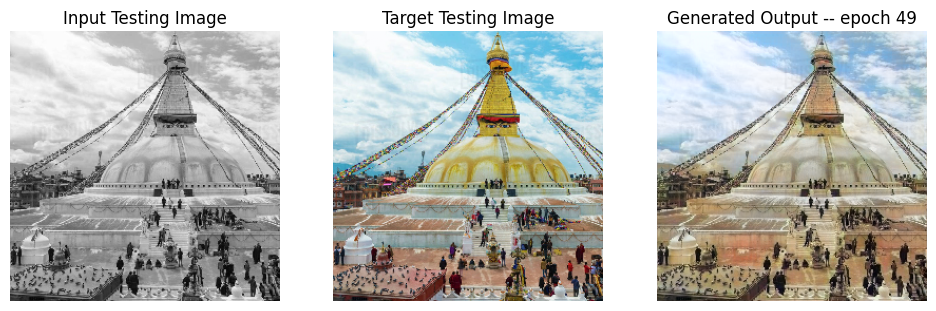

SSIM Score: 0.9165199398994446
PSNR Score: 22.667720794677734
Epoch 49
Training Details
Generator-- total_loss:52.08054 gan_loss:44.86855 l1_loss:0.04081 perceptual_loss:0.00727 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.88520 PSNR 23.67985 LPIPS 0.00000
Time taken for epoch 50 is 428.3350031375885 sec
Number of iteration 525
Validation Details
Generator-- total_loss:60.29813 gan_loss:52.88639 l1_loss:0.04190  perceptual_loss:0.00752 Discriminator-- total_loss:17.57469 real_loss:0.00095 generated_loss:17.57373 --- SSIM 0.91054 PSNR 23.27288 LPIPS 0.00000
Time taken for epoch 50 is 475.66997385025024 sec
Number of iteration 70
Epoch 50
Training Details
Generator-- total_loss:52.11538 gan_loss:44.88688 l1_loss:0.04093 perceptual_loss:0.00726 Discriminator-- total_loss:0.00001 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.88548 PSNR 23.65300 LPIPS 0.00000
Time taken for epoch 51 is 426.3636837005615 sec
Number of iteration 525
Validation D

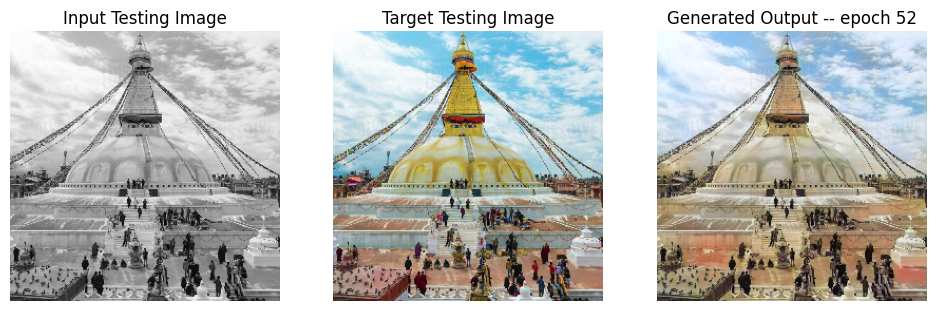

SSIM Score: 0.9122927188873291
PSNR Score: 22.621246337890625
Epoch 52
Training Details
Generator-- total_loss:84.79025 gan_loss:77.55661 l1_loss:0.04096 perceptual_loss:0.00727 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00001 --- SSIM 0.88657 PSNR 23.65421 LPIPS 0.00000
Time taken for epoch 53 is 425.5889573097229 sec
Number of iteration 525
Validation Details
Generator-- total_loss:94.28951 gan_loss:86.94201 l1_loss:0.04147  perceptual_loss:0.00751 Discriminator-- total_loss:56.87008 real_loss:0.00000 generated_loss:56.87008 --- SSIM 0.91221 PSNR 23.37094 LPIPS 0.00000
Time taken for epoch 53 is 472.23355054855347 sec
Number of iteration 70
Epoch 53
Training Details
Generator-- total_loss:84.67545 gan_loss:77.43966 l1_loss:0.04094 perceptual_loss:0.00730 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.88561 PSNR 23.65206 LPIPS 0.00000
Time taken for epoch 54 is 423.3877058029175 sec
Number of iteration 525
Validation D

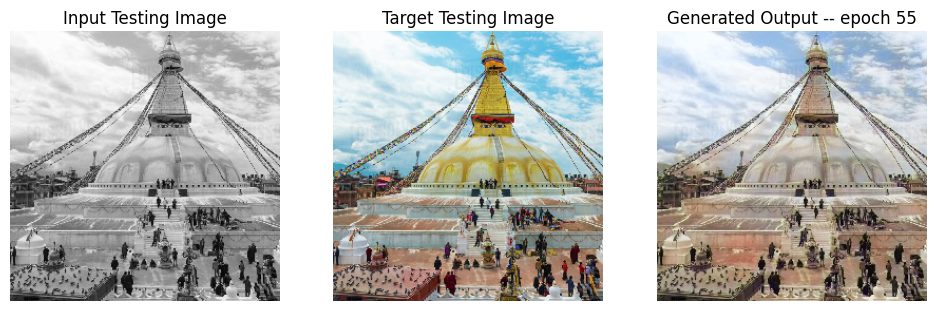

SSIM Score: 0.9178265929222107
PSNR Score: 22.594242095947266
Epoch 55
Training Details
Generator-- total_loss:6.33527 gan_loss:0.00000 l1_loss:0.03548 perceptual_loss:0.00675 Discriminator-- total_loss:88.21455 real_loss:88.21455 generated_loss:0.00001 --- SSIM 0.91918 PSNR 25.18343 LPIPS 0.00000
Time taken for epoch 56 is 567.5483498573303 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.84425 gan_loss:0.00000 l1_loss:0.03842  perceptual_loss:0.00721 Discriminator-- total_loss:99.23162 real_loss:99.23162 generated_loss:0.00000 --- SSIM 0.94744 PSNR 24.40313 LPIPS 0.00000
Time taken for epoch 56 is 614.5105578899384 sec
Number of iteration 70
Epoch 56
Training Details
Generator-- total_loss:6.32180 gan_loss:0.00000 l1_loss:0.03543 perceptual_loss:0.00672 Discriminator-- total_loss:87.92883 real_loss:87.92881 generated_loss:0.00002 --- SSIM 0.92013 PSNR 25.19792 LPIPS 0.00000
Time taken for epoch 57 is 569.0983009338379 sec
Number of iteration 525
Validation Deta

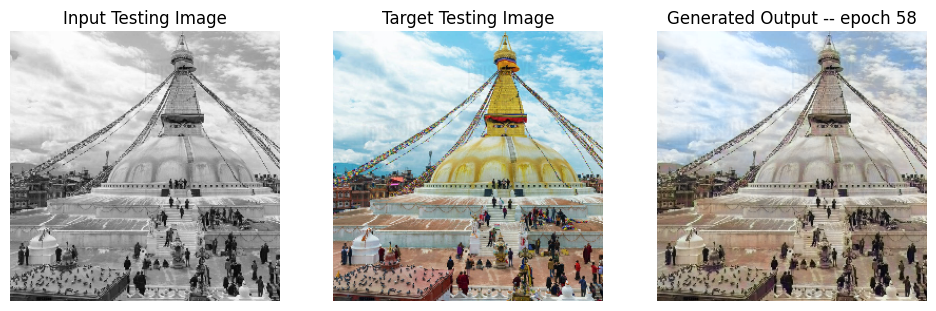

SSIM Score: 0.9200255870819092
PSNR Score: 22.49842643737793
Epoch 58
Training Details
Generator-- total_loss:6.26985 gan_loss:0.00000 l1_loss:0.03512 perceptual_loss:0.00668 Discriminator-- total_loss:89.38963 real_loss:89.38963 generated_loss:0.00000 --- SSIM 0.91997 PSNR 25.25778 LPIPS 0.00000
Time taken for epoch 59 is 566.0685751438141 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.81633 gan_loss:0.00000 l1_loss:0.03839  perceptual_loss:0.00705 Discriminator-- total_loss:83.34409 real_loss:83.34409 generated_loss:0.00000 --- SSIM 0.94789 PSNR 24.35884 LPIPS 0.00000
Time taken for epoch 59 is 612.4162821769714 sec
Number of iteration 70
Epoch 59
Training Details
Generator-- total_loss:6.26244 gan_loss:0.00000 l1_loss:0.03507 perceptual_loss:0.00668 Discriminator-- total_loss:88.78504 real_loss:88.78504 generated_loss:0.00000 --- SSIM 0.92035 PSNR 25.26807 LPIPS 0.00000
Time taken for epoch 60 is 569.4440279006958 sec
Number of iteration 525
Validation Detai

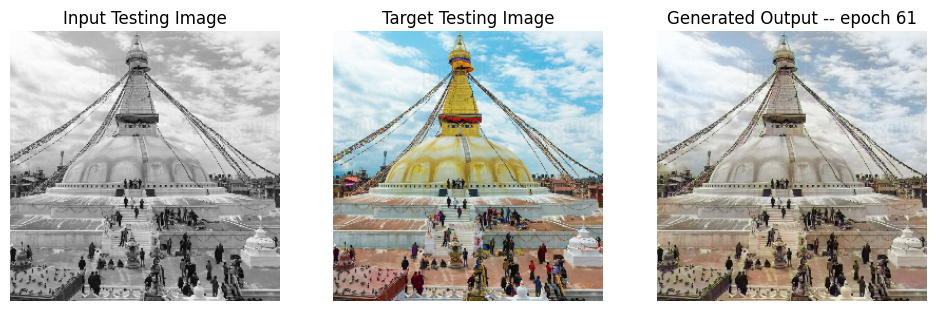

SSIM Score: 0.9167020916938782
PSNR Score: 22.36216163635254
Epoch 61
Training Details
Generator-- total_loss:6.26235 gan_loss:0.00080 l1_loss:0.03510 perceptual_loss:0.00665 Discriminator-- total_loss:89.95593 real_loss:89.95585 generated_loss:0.00008 --- SSIM 0.91966 PSNR 25.27642 LPIPS 0.00000
Time taken for epoch 62 is 571.0948600769043 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.85788 gan_loss:0.00000 l1_loss:0.03856  perceptual_loss:0.00716 Discriminator-- total_loss:76.26562 real_loss:76.26562 generated_loss:0.00000 --- SSIM 0.95055 PSNR 24.51241 LPIPS 0.00000
Time taken for epoch 62 is 618.7559335231781 sec
Number of iteration 70
Epoch 62
Training Details
Generator-- total_loss:6.24709 gan_loss:0.00000 l1_loss:0.03501 perceptual_loss:0.00664 Discriminator-- total_loss:90.36004 real_loss:90.36004 generated_loss:0.00000 --- SSIM 0.91978 PSNR 25.28477 LPIPS 0.00000
Time taken for epoch 63 is 573.2904939651489 sec
Number of iteration 525
Validation Detai

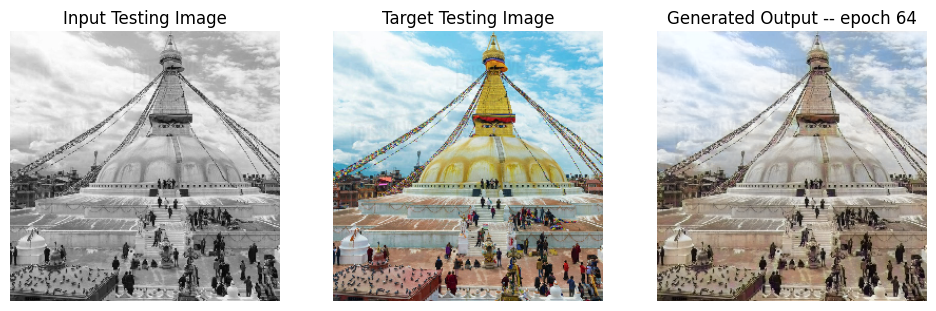

SSIM Score: 0.9217737317085266
PSNR Score: 22.7659969329834
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 64.
Epoch 64
Training Details
Generator-- total_loss:19.00587 gan_loss:12.72836 l1_loss:0.03524 perceptual_loss:0.00661 Discriminator-- total_loss:0.64262 real_loss:0.43511 generated_loss:0.20751 --- SSIM 0.92103 PSNR 25.22936 LPIPS 0.00000
Time taken for epoch 65 is 431.4034342765808 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.96340 gan_loss:0.61753 l1_loss:0.03553  perceptual_loss:0.00678 Discriminator-- total_loss:2.73182 real_loss:2.44472 generated_loss:0.28710 --- SSIM 0.94941 PSNR 25.04156 LPIPS 0.00000
Time taken for epoch 65 is 478.6870174407959 sec
Number of iteration 70
Epoch 65
Training Details
Generator-- total_loss:21.47384 gan_loss:15.21003 l1_loss:0.03515 perceptual_loss:0.00661 Discriminator-- total_loss:0.04223 real_loss:0.01873 generated_loss:0.02349 --- SSIM 0.91972 PSNR 25.23490 LPIPS 0.00000
Time taken for epo

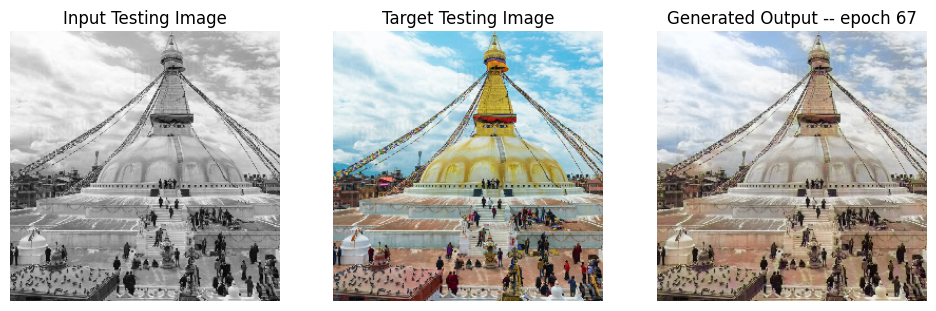

SSIM Score: 0.9202933311462402
PSNR Score: 22.51297950744629
Epoch 67
Training Details
Generator-- total_loss:23.58633 gan_loss:17.30722 l1_loss:0.03523 perceptual_loss:0.00663 Discriminator-- total_loss:0.01023 real_loss:0.00502 generated_loss:0.00521 --- SSIM 0.91994 PSNR 25.23222 LPIPS 0.00000
Time taken for epoch 68 is 433.29045033454895 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.80195 gan_loss:0.44376 l1_loss:0.03553  perceptual_loss:0.00686 Discriminator-- total_loss:2.93834 real_loss:2.71032 generated_loss:0.22802 --- SSIM 0.94924 PSNR 25.01161 LPIPS 0.00000
Time taken for epoch 68 is 480.5478687286377 sec
Number of iteration 70
Epoch 68
Training Details
Generator-- total_loss:24.89063 gan_loss:18.61287 l1_loss:0.03523 perceptual_loss:0.00662 Discriminator-- total_loss:0.00766 real_loss:0.00354 generated_loss:0.00412 --- SSIM 0.91856 PSNR 25.23557 LPIPS 0.00000
Time taken for epoch 69 is 432.6815650463104 sec
Number of iteration 525
Validation Detail

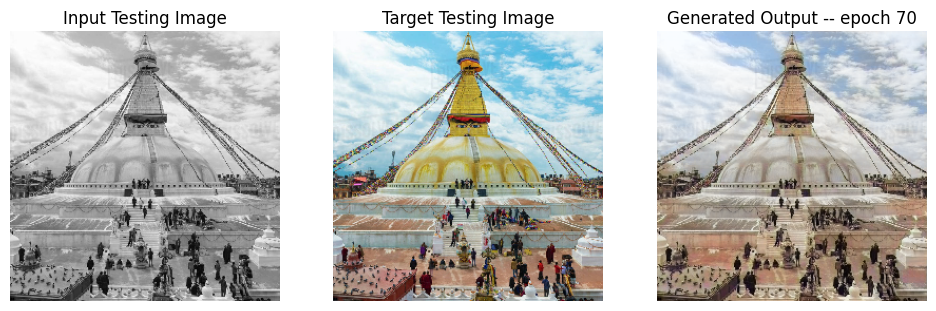

SSIM Score: 0.9180371165275574
PSNR Score: 22.57154655456543
Reduced generator learning rate to 0.0002025000096182339 at epoch 70
Epoch 70
Training Details
Generator-- total_loss:6.38549 gan_loss:0.07949 l1_loss:0.03532 perceptual_loss:0.00672 Discriminator-- total_loss:15.74625 real_loss:15.68829 generated_loss:0.05796 --- SSIM 0.91642 PSNR 25.12073 LPIPS 0.00000
Time taken for epoch 71 is 580.5450258255005 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.52204 gan_loss:0.00056 l1_loss:0.03660  perceptual_loss:0.00688 Discriminator-- total_loss:13.87590 real_loss:13.68179 generated_loss:0.19411 --- SSIM 0.94838 PSNR 24.71128 LPIPS 0.00000
Time taken for epoch 71 is 627.729165315628 sec
Number of iteration 70
Epoch 71
Training Details
Generator-- total_loss:6.24920 gan_loss:0.01188 l1_loss:0.03498 perceptual_loss:0.00661 Discriminator-- total_loss:16.10386 real_loss:16.04261 generated_loss:0.06125 --- SSIM 0.91959 PSNR 25.23678 LPIPS 0.00000
Time taken for epoch 

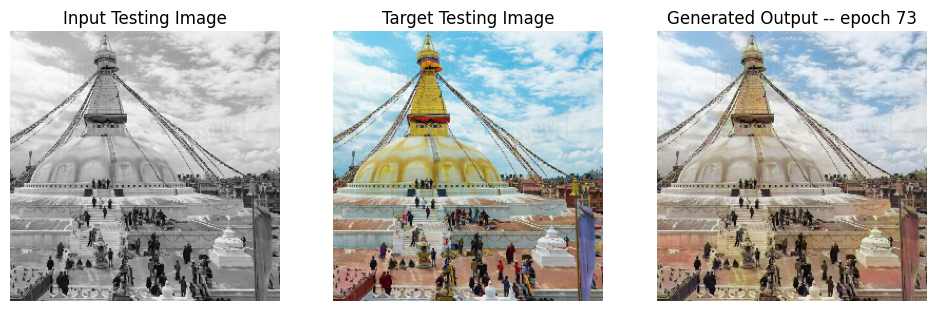

SSIM Score: 0.910214900970459
PSNR Score: 22.715190887451172
Epoch 73
Training Details
Generator-- total_loss:6.20858 gan_loss:0.00879 l1_loss:0.03476 perceptual_loss:0.00657 Discriminator-- total_loss:16.11241 real_loss:16.03902 generated_loss:0.07339 --- SSIM 0.91755 PSNR 25.31171 LPIPS 0.00000
Time taken for epoch 74 is 580.6622829437256 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.28348 gan_loss:0.00020 l1_loss:0.03508  perceptual_loss:0.00680 Discriminator-- total_loss:13.52609 real_loss:13.40982 generated_loss:0.11627 --- SSIM 0.94844 PSNR 25.08611 LPIPS 0.00000
Time taken for epoch 74 is 628.3657467365265 sec
Number of iteration 70
Epoch 74
Training Details
Generator-- total_loss:6.19730 gan_loss:0.01054 l1_loss:0.03469 perceptual_loss:0.00655 Discriminator-- total_loss:16.05179 real_loss:15.97657 generated_loss:0.07523 --- SSIM 0.91878 PSNR 25.31268 LPIPS 0.00000
Time taken for epoch 75 is 580.4547908306122 sec
Number of iteration 525
Validation Detai

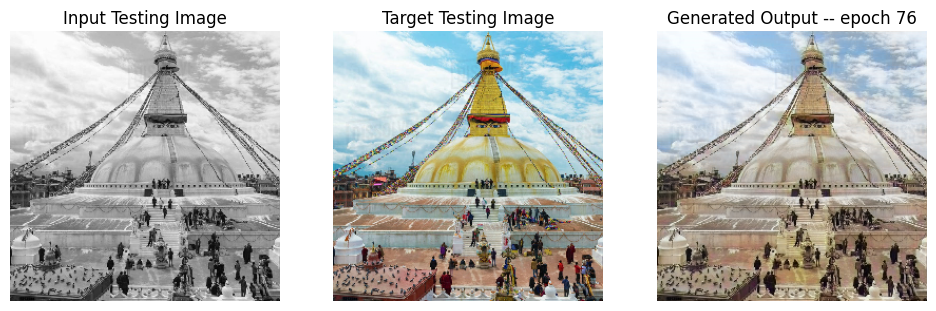

SSIM Score: 0.919844925403595
PSNR Score: 22.998279571533203
Epoch 76
Training Details
Generator-- total_loss:6.18728 gan_loss:0.00630 l1_loss:0.03467 perceptual_loss:0.00654 Discriminator-- total_loss:15.36711 real_loss:15.28561 generated_loss:0.08150 --- SSIM 0.91804 PSNR 25.34483 LPIPS 0.00000
Time taken for epoch 77 is 576.3990139961243 sec
Number of iteration 525
Validation Details
Generator-- total_loss:6.39853 gan_loss:0.00014 l1_loss:0.03592  perceptual_loss:0.00674 Discriminator-- total_loss:14.67434 real_loss:14.54039 generated_loss:0.13395 --- SSIM 0.94630 PSNR 24.89536 LPIPS 0.00000
Time taken for epoch 77 is 623.8244934082031 sec
Number of iteration 70


In [53]:
fit(train_dataset, epochs, val, gen)

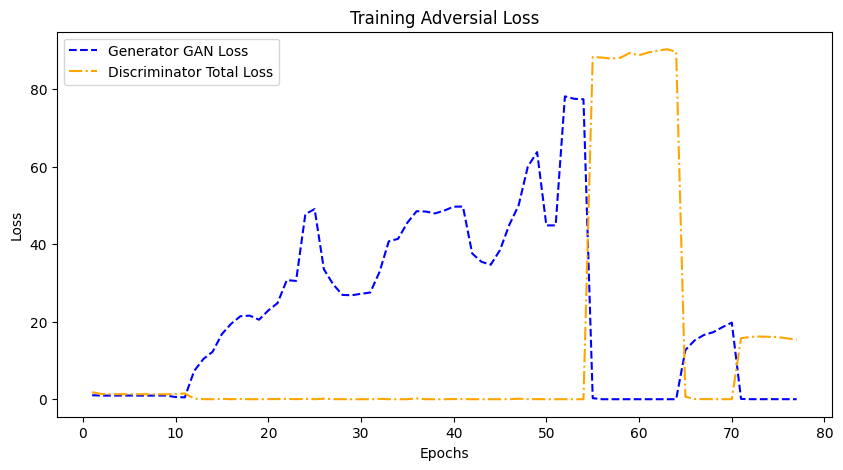

In [54]:
epochs = range(1, len(train_generator_losses) + 1)
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Training Adversial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

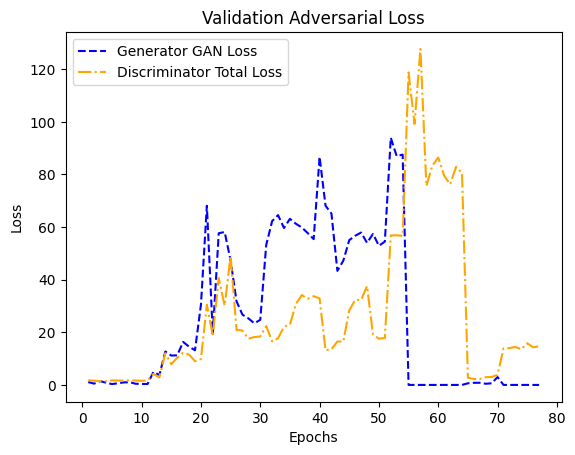

In [55]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Validation Adversarial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

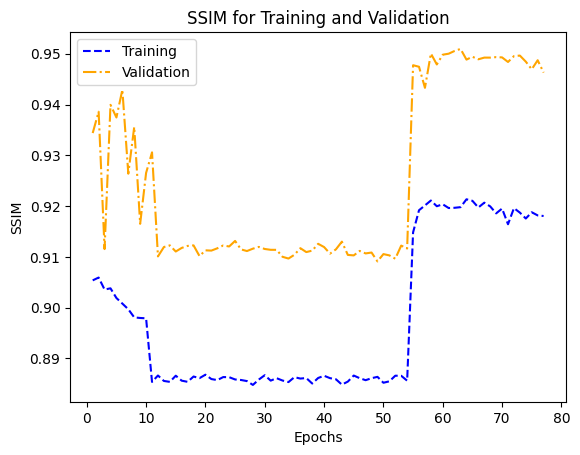

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

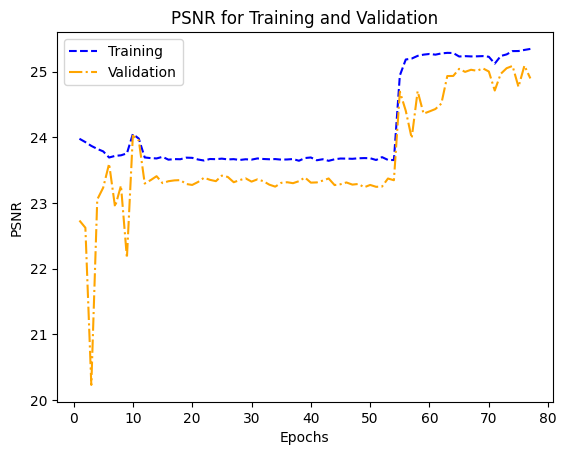

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

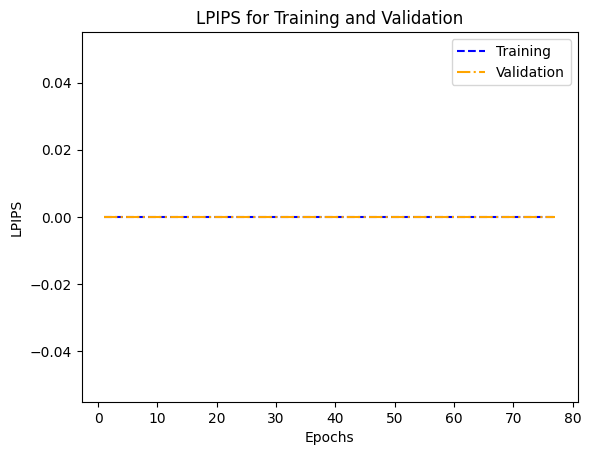

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

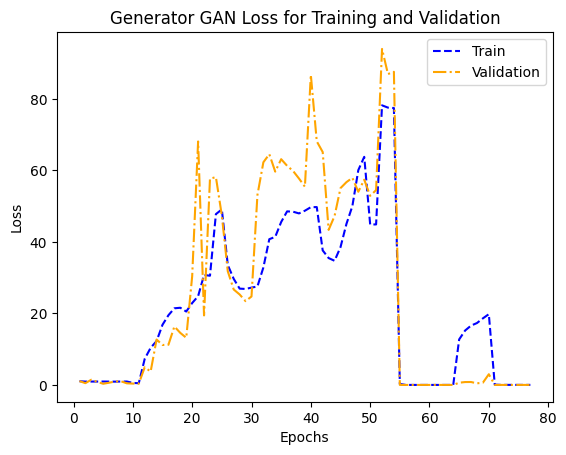

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

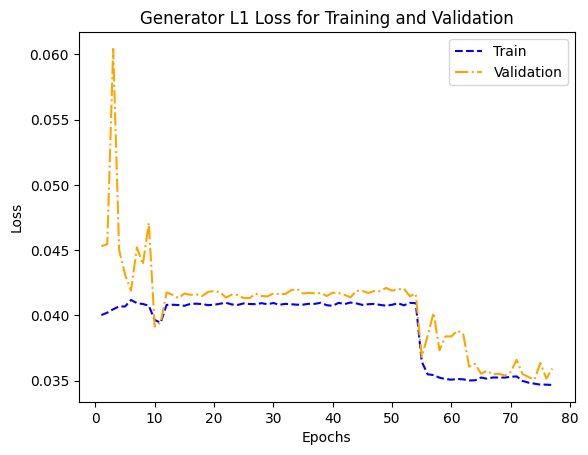

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

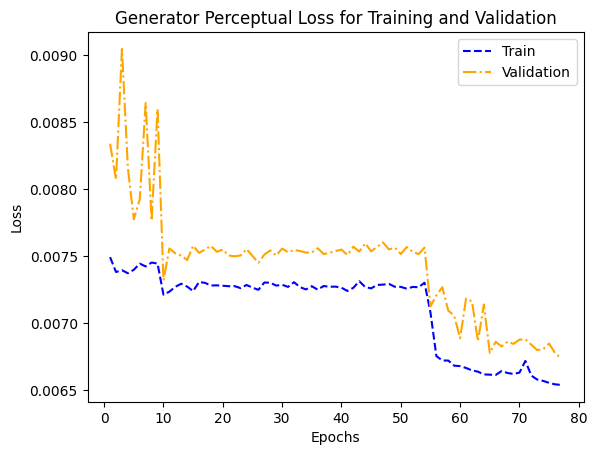

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

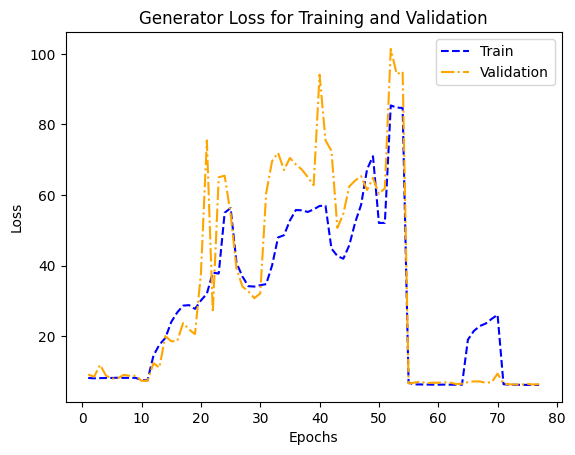

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

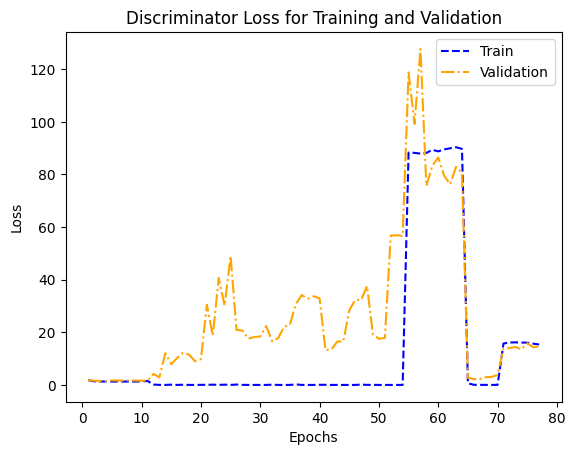

In [63]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

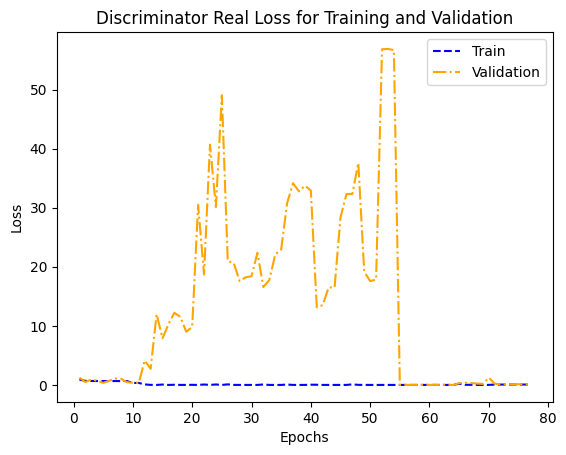

In [64]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

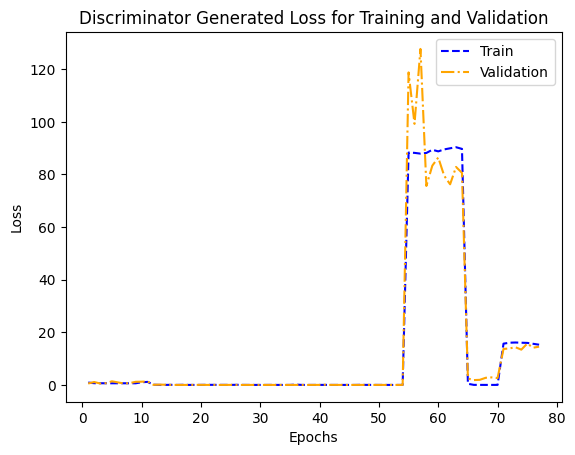

In [65]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [66]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [67]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [68]:
os.mkdir('/kaggle/working/modelsFeb7')

In [69]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [70]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [71]:
import subprocess
from IPython.display import FileLink, display

In [72]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip